### Setup

In [1]:
using Pkg

Pkg.add(url="https://github.com/mppmu/BoostFractor.jl.git")
Pkg.add(url="https://github.com/bergermann/Dragoon.jl.git")
Pkg.update()




#Try Pkg.instantiate() if package issues arise

    Updating git-repo `https://github.com/bergermann/Dragoon.jl.git`


    Updating registry at `C:\Users\domin\.julia\registries\General.toml`


   Resolving package versions...


    Updating `C:\Users\domin\.julia\environments\v1.9\Project.toml`
  [2528b1d8] ~ Dragoon v0.0.0 `https://github.com/bergermann/Dragoon.jl.git#main` ⇒ v0.0.0 `https://github.com/bergermann/Dragoon.jl.git#main`
    Updating `C:\Users\domin\.julia\environments\v1.9\Manifest.toml`
  [2528b1d8] ~ Dragoon v0.0.0 `https://github.com/bergermann/Dragoon.jl.git#main` ⇒ v0.0.0 `https://github.com/bergermann/Dragoon.jl.git#main`

Precompiling project...


  ✓ Dragoon


  1 dependency successfully precompiled in 8 seconds. 153 already precompiled.


In [2]:
using Dragoon
using Plots
# using Dates

In [3]:
#number of discs in the booster
n = 20

#initial disc configuration
#findpeak tries to find an equidistant configuration with a peak at f
initdist = findpeak(22.025e9,n)

#generate frequencies for calculation and for plotting
freqs = genFreqs(22.025e9,50e6; length=10) #optimize on these frequencies
freqsplot = genFreqs(22.025e9,150e6; length=1000)

#initialize physical properties of the booster
booster = AnalyticalBooster(initdist)
booster.tand = 0.
# booster.timestamp = DateTime(0)
#=
Booster(
    pos,              disc positions
    ndisk,            disc number
    thickness,        disc thickness
    epsilon,          disc epsilon
    vmotor,           motor speed
    maxlength,        maximum allowed booster length (not implemented yet)
    timestamp,        booster operation time
    summedtraveltime, summed motor operation time
    codetimestamp     code runtime
)
=#

#initialize storage of measurements
hist = initHist(booster,10000,freqs,ObjAnalytical)
#                           ^ length, should be at least the larger of (n^2, search steps)
;

Objective Value: -243.3, Timestamp: 0000-01-01T00:00:00


### Optimizer

In [4]:
#=
how to use

T = collect(range(100; length=1001,stop=0))

trace = simulatedAnnealing(booster,hist,freqs,
            T,100e-6,
            ObjAnalytical,
            UnstuckDont;
            maxiter=Int(1e6),
            showtrace=true,
            showevery=100,
            unstuckisiter=true,
            traceevery=100,
            resettimer=true)

returns trace, access with
trace[iteration].x      disc position
                .obj    objective value
                .g      gradient
                .h      hessian
                .t      timestamp
                .T      summed travel time
=#

In [5]:
T = collect(range(100; length=1001,stop=0))

trace = simulatedAnnealing(booster,hist,freqs,
            T,100e-6,
            ObjAnalytical,
            UnstuckDont;
            maxiter=Int(1e6),
            showtrace=true,
            showevery=100,
            unstuckisiter=true,
            traceevery=1,
            resettimer=true)
;

Iter: 1000, timestamp: 4 minutes, 57 seconds
Iter finished. Objective value current:  -13298.958
               Objective value solution: -13423.853
               Temperature:              90.01



Iter: 2000, timestamp: 10 minutes, 11 seconds
Iter finished. Objective value current:  -13941.723
               Objective value solution: -14057.777
               Temperature:              80.01



Iter: 3000, timestamp: 15 minutes, 33 seconds
Iter finished. Objective value current:  -14446.566
               Objective value solution: -14448.498
               Temperature:              70.01

Iter: 4000, timestamp: 21 minutes, 3 seconds
Iter finished. Objective value current:  -14518.121
               Objective value solution: -14573.53
               Temperature:              60.01



Iter: 5000, timestamp: 26 minutes, 39 seconds
Iter finished. Objective value current:  -14626.012
               Objective value solution: -14651.177
               Temperature:              50.01

Iter: 6000, timestamp: 31 minutes, 58 seconds
Iter finished. Objective value current:  -14615.068
               Objective value solution: -14651.177
               Temperature:              40.01



Iter: 7000, timestamp: 37 minutes, 24 seconds
Iter finished. Objective value current:  -14608.912
               Objective value solution: -14653.474
               Temperature:              30.01

Iter: 8000, timestamp: 42 minutes, 45 seconds
Iter finished. Objective value current:  -14620.804
               Objective value solution: -14653.474
               Temperature:              20.01



Iter: 9000, timestamp: 48 minutes, 9 seconds
Iter finished. Objective value current:  -14655.76
               Objective value solution: -14680.9
               Temperature:              10.01

Iter: 10000, timestamp: 53 minutes, 31 seconds
Iter finished. Objective value current:  -14714.523
               Objective value solution: -14714.523
               Temperature:              0.01

Terminated. 10001 Iterations.
Final objective value: -14714.523
Elapsed movement time:  53 minutes, 31 seconds


Summed movement time:   7 hours, 57 minutes, 9 seconds
Elapsed computing time: 1 second, 131 milliseconds


In [6]:
#obtain result, booster is now in optimized position
#pos2dist(booster.pos)     #in distance space
booster.pos               #in position space

20-element Vector{Float64}:
 0.007247735971065718
 0.0153536059801698
 0.02349362482860758
 0.031725725101436765
 0.04008360063487755
 0.04825499586047874
 0.056374071955164216
 0.06465167235674646
 0.07290613551219695
 0.08109457086693071
 0.08921112321349785
 0.09773128357821437
 0.10577817561583536
 0.11401211688831774
 0.12224161990470536
 0.13068863948122553
 0.13873058422193918
 0.14693888933980132
 0.1548545450769799
 0.16304131758897814

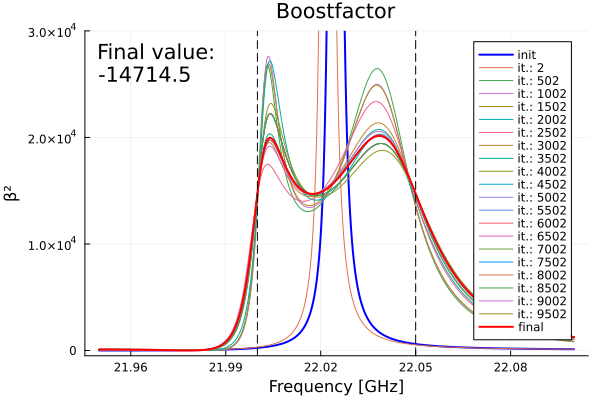

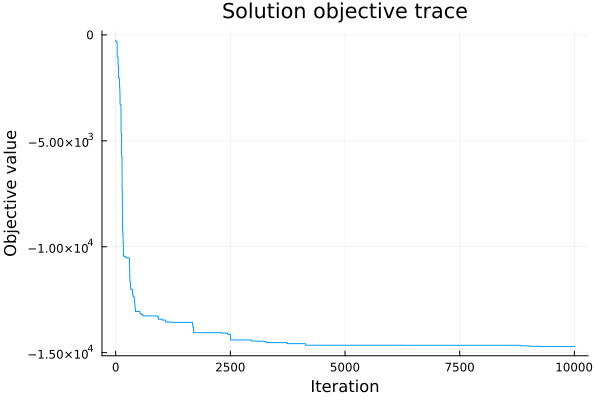

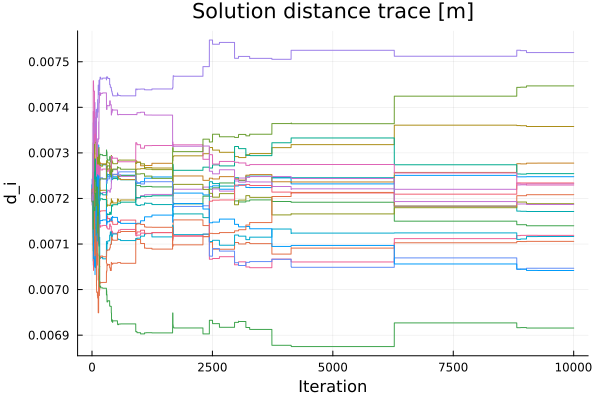

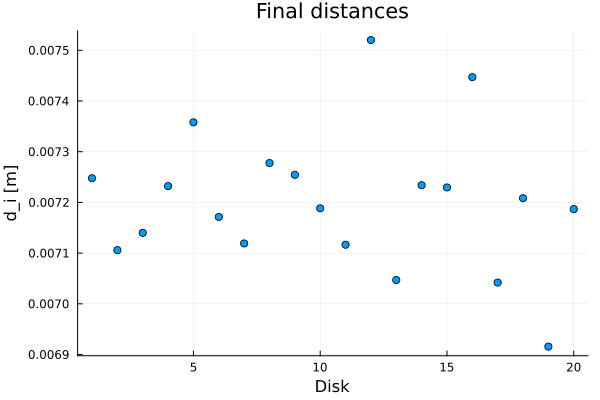

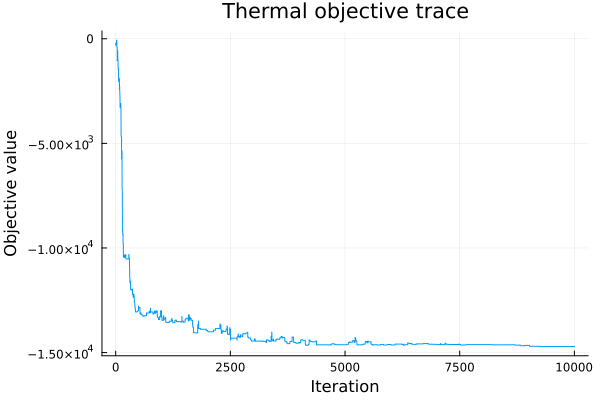

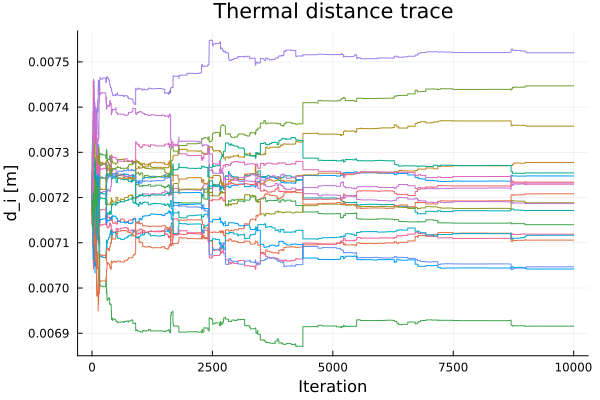

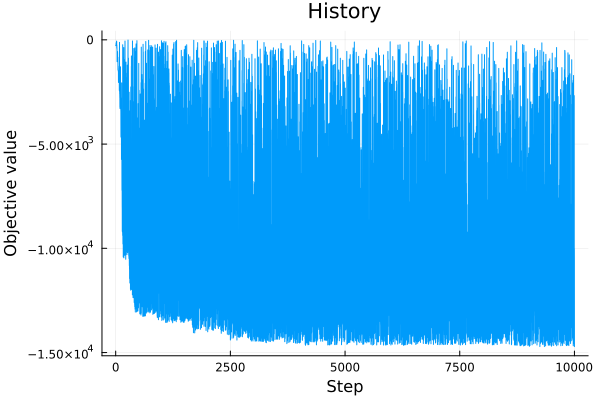

(Plot{Plots.GRBackend() n=23}, Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=20}, Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=20}, Plot{Plots.GRBackend() n=1})

In [7]:
#get handy output
analyse(hist,trace[1:end-1],freqsplot; freqs=freqs,div=20,scale=1e9,ylim=[-0.05e4,3e4])

#savefig(plt[i],"cool_epic_result_wow.svg")

In [8]:
# R = Dragoon.getRef1d(booster,genFreqs(22.025e9,50e6; length=50))
# [println(r) for r in R]

0.8263795882426102 - 0.5631134664843181im
0.6217978909177027 - 0.7831777466516134im
0.36518947402750834 - 0.930933213533323im
0.09054071755981363 - 0.995892754499056im
-0.17091524335574554 - 0.9852857349970306im
-0.3987426628888668 - 0.9170628597824346im
-0.5843650544352856 - 0.8114909014615057im
-0.7278048375683879 - 0.6857843089573167im
-0.8336427414287829 - 0.5523040644998575im
-0.9080263693289219 - 0.4189130131701713im
-0.9569970051205908 - 0.2900977976307397im
-0.9857704646142852 - 0.16809696931867726im
-0.9985532075844357 - 0.05377259174395048im
-0.9986053306614413 + 0.05279577231706312im
-0.9883906093876044 + 0.15193420705812063im
-0.9697381902810829 + 0.2441471734638267im
-0.9439860692264326 + 0.3299853043794827im
-0.9120982412362575 + 0.4099717043086497im
-0.8747567442164084 + 0.4845623163721249im
-0.8324326429600535 + 0.5541262445819852im
-0.7854409256890892 + 0.618936630239858im
-0.7339831884942264 + 0.6791676368967158im
-0.6781821262903701 + 0.7348938723246068im
-0.61810975

50-element Vector{Nothing}:
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 ⋮
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing